In [3]:
import scanpy as sc
import anndata as ad
import pandas as pd
import loompy as lp
import glob
import numpy as np

In [51]:
pip install -U scvelo

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.8/196.8 KB 4.6 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
import scvelo as scv

In [4]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [16]:
# List of file paths
loom_files = glob.glob("data/velocyto_outs/*.loom")
loom_files

['data/velocyto_outs/day6_mTfr_all.loom',
 'data/velocyto_outs/day11_mTfr_all.loom',
 'data/velocyto_outs/D104T14_forcedCells_all.loom',
 'data/velocyto_outs/day0_Treg_all.loom',
 'data/velocyto_outs/D104T11_forcedCells_all.loom',
 'data/velocyto_outs/D104T15_forcedCells.loom',
 'data/velocyto_outs/D104T16_forcedCells_correct.loom',
 'data/velocyto_outs/D104T13_forcedCells_all.loom']

In [17]:
def load_loom(f):
    a = sc.read_loom(f)
    a.var_names_make_unique()
    return a

In [18]:
velocyto = [load_loom(f) for f in loom_files]

In [19]:
velocyto

[AnnData object with n_obs × n_vars = 4286 × 32285
     obs: 'Clusters', '_X', '_Y'
     var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
     layers: 'matrix', 'ambiguous', 'spliced', 'unspliced',
 AnnData object with n_obs × n_vars = 925 × 32285
     obs: 'Clusters', '_X', '_Y'
     var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
     layers: 'matrix', 'ambiguous', 'spliced', 'unspliced',
 AnnData object with n_obs × n_vars = 8000 × 32285
     obs: 'Clusters', '_X', '_Y'
     var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
     layers: 'matrix', 'ambiguous', 'spliced', 'unspliced',
 AnnData object with n_obs × n_vars = 5538 × 32285
     obs: 'Clusters', '_X', '_Y'
     var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
     layers: 'matrix', 'ambiguous', 'spliced', 'unspliced',
 AnnData object with n_obs × n_vars = 8000 × 32285
     obs: 'Clusters', '_X', '_Y'
     var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
     layers: 'matrix', 'ambiguo

In [20]:
samples = ["hCD2_d6_Tfr", "hCD2_d11_Tfr", "D104T14", "hCD2_d0_Treg", 
           "D104T11", "D104T15", "D104T16", "D104T13"]

In [21]:
# Concatenate with custom labels and prefixes
velocity = ad.concat(
    velocyto,
    join="outer",
    label="orig.ident",         # Name of the column in .obs that stores the label
    keys=samples     # These labels go into .obs['orig.ident']
)
velocity

AnnData object with n_obs × n_vars = 50749 × 32285
    obs: 'Clusters', '_X', '_Y', 'orig.ident'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [22]:
velocity.var_names

Index(['AC125149.3', 'AC125149.5', 'AC125149.2', 'AC125149.1', 'AC125149.4',
       'AC133103.4', 'AC133103.6', 'AC133103.5', 'AC133103.3', 'AC133103.7',
       ...
       'Gm28406', 'Gm29436', 'Gm28407', 'Gm29393', 'Gm21294', 'Gm28672',
       'Gm28670', 'Gm29504', 'Gm20837', 'Gm47283'],
      dtype='object', name='Gene', length=32285)

In [23]:
velocity.obs_names

Index(['day6_mTfr_all:AACCTTTGTTTCGTTTx', 'day6_mTfr_all:AAACCCATCATCTGTTx',
       'day6_mTfr_all:AACAAGAAGCGTGAACx', 'day6_mTfr_all:AAAGAACGTAGGCTCCx',
       'day6_mTfr_all:AAAGGTACATCTTAGGx', 'day6_mTfr_all:AACGTCACACAGTGAGx',
       'day6_mTfr_all:AAAGGGCTCTCAATCTx', 'day6_mTfr_all:AACGAAATCAGAACCTx',
       'day6_mTfr_all:AAACCCATCTAAGAAGx', 'day6_mTfr_all:AAAGGGCCAGTACTACx',
       ...
       'D104T13_forcedCells_all:TTTATGCGTGTCGCTGx',
       'D104T13_forcedCells_all:TTTGGTTTCACCGGGTx',
       'D104T13_forcedCells_all:TTTGCGCGTAGCGTAGx',
       'D104T13_forcedCells_all:TTTGTCATCAGTGCATx',
       'D104T13_forcedCells_all:TTTGTCAGTCGAAAGCx',
       'D104T13_forcedCells_all:TTTATGCTCAAGGCTTx',
       'D104T13_forcedCells_all:TTTACTGGTTCCACGGx',
       'D104T13_forcedCells_all:TTTCCTCGTATAGTAGx',
       'D104T13_forcedCells_all:TTTCCTCGTAAGGGCTx',
       'D104T13_forcedCells_all:TTTGGTTGTTCGGGCTx'],
      dtype='object', name='CellID', length=50749)

In [24]:
velocity.obs

,Clusters,_X,_Y,orig.ident
CellID,,,,
day6_mTfr_all:AACCTTTGTTTCGTTTx,6,6.841977,5.360396,hCD2_d6_Tfr
day6_mTfr_all:AAACCCATCATCTGTTx,2,9.911991,32.089924,hCD2_d6_Tfr
day6_mTfr_all:AACAAGAAGCGTGAACx,1,-6.008650,-2.706017,hCD2_d6_Tfr
day6_mTfr_all:AAAGAACGTAGGCTCCx,1,-15.188404,-27.816040,hCD2_d6_Tfr
day6_mTfr_all:AAAGGTACATCTTAGGx,1,-8.952108,-14.117277,hCD2_d6_Tfr
...,...,...,...,...
D104T13_forcedCells_all:TTTATGCTCAAGGCTTx,0,-12.866733,12.105527,D104T13
D104T13_forcedCells_all:TTTACTGGTTCCACGGx,0,-21.224304,-10.641002,D104T13
D104T13_forcedCells_all:TTTCCTCGTATAGTAGx,5,0.183998,-5.536257,D104T13


In [25]:
def format_cell_id(obs_names, orig_ident):
    new_ids = []
    for full_id, sample in zip(obs_names, orig_ident):
        # Get barcode part after ':' and strip 'x' if present
        barcode = full_id.split(":")[-1].rstrip("x")
        new_id = f"{sample}_{barcode}-1"
        new_ids.append(new_id)
    return new_ids

In [26]:
velocity.obs_names = format_cell_id(velocity.obs_names, velocity.obs['orig.ident'])

In [27]:
velocity.obs_names

Index(['hCD2_d6_Tfr_AACCTTTGTTTCGTTT-1', 'hCD2_d6_Tfr_AAACCCATCATCTGTT-1',
       'hCD2_d6_Tfr_AACAAGAAGCGTGAAC-1', 'hCD2_d6_Tfr_AAAGAACGTAGGCTCC-1',
       'hCD2_d6_Tfr_AAAGGTACATCTTAGG-1', 'hCD2_d6_Tfr_AACGTCACACAGTGAG-1',
       'hCD2_d6_Tfr_AAAGGGCTCTCAATCT-1', 'hCD2_d6_Tfr_AACGAAATCAGAACCT-1',
       'hCD2_d6_Tfr_AAACCCATCTAAGAAG-1', 'hCD2_d6_Tfr_AAAGGGCCAGTACTAC-1',
       ...
       'D104T13_TTTATGCGTGTCGCTG-1', 'D104T13_TTTGGTTTCACCGGGT-1',
       'D104T13_TTTGCGCGTAGCGTAG-1', 'D104T13_TTTGTCATCAGTGCAT-1',
       'D104T13_TTTGTCAGTCGAAAGC-1', 'D104T13_TTTATGCTCAAGGCTT-1',
       'D104T13_TTTACTGGTTCCACGG-1', 'D104T13_TTTCCTCGTATAGTAG-1',
       'D104T13_TTTCCTCGTAAGGGCT-1', 'D104T13_TTTGGTTGTTCGGGCT-1'],
      dtype='object', length=50749)

In [28]:
qc_filter = pd.read_csv("analysis/integration/cell_barcodes.csv", index_col=0).index.tolist()

In [29]:
velocity = velocity[velocity.obs_names.isin(qc_filter)]

In [30]:
velocity

View of AnnData object with n_obs × n_vars = 21255 × 32285
    obs: 'Clusters', '_X', '_Y', 'orig.ident'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [32]:
velocity.write("analysis/rna_velocity/velocyto_combined_raw.h5ad")

In [74]:
velocity = sc.read("analysis/rna_velocity/velocyto_combined_raw.h5ad")

In [75]:
velocity

AnnData object with n_obs × n_vars = 21255 × 32285
    obs: 'Clusters', '_X', '_Y', 'orig.ident'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

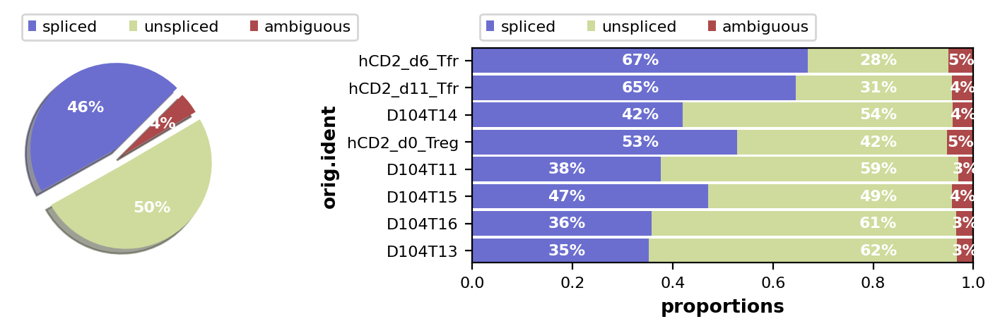

In [130]:
scv.pl.proportions(velocity, groupby="orig.ident")

In [76]:
adata  = sc.read("analysis/integration/anndata_annot.h5ad")

In [77]:
adata

AnnData object with n_obs × n_vars = 21255 × 33262
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'experiment', 'day', 'cell_type', 'S.Score', 'G2M.Score', 'Phase', 'SNN_harmony20_res.0.2', 'SNN_harmony20_res.0.3', 'SNN_harmony20_res.0.4', 'SNN_harmony20_res.0.5', 'SNN_harmony20_res.0.6', 'SNN_harmony20_res.0.7', 'SNN_harmony20_res.0.8', 'SNN_harmony20_res.0.9', 'SNN_harmony20_res.1', 'seurat_clusters', 'sample_type', 'D104T11_annotation', 'leiden_res_0.1', 'leiden_res_0.2', 'leiden_res_0.3', 'leiden_res_0.4', 'leiden_res_0.5', 'leiden_res_0.6', 'leiden_res_0.7', 'leiden_res_0.8', 'leiden_res_0.9', 'leiden_res_1.0', 'bbknn_annotation'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Phase_colors', 'SNN_harmony20_res.0.3_colors', 'SNN_harmony20_res.0.4_colors', 'SNN_harmony20_res.0.5_colors', 'SNN_harmony20_res.0.6_colors', 'bbknn_annotation_colors', 'cell_type_colors', 'day_colors', 'dendrogram_leiden_res_

In [78]:
adata.uns["neighbors"]

{'connectivities_key': 'connectivities',
 'distances_key': 'distances',
 'params': {'bbknn': {'batch_key': 'experiment',
   'computation': 'annoy',
   'trim': 60},
  'method': 'umap',
  'metric': 'euclidean',
  'n_neighbors': 6,
  'n_pcs': 30,
  'use_rep': 'X_pca'}}

In [79]:
len(velocity.var_names.intersection(adata.var_names))

32003

In [117]:
non_common_genes = []
for gene in set(velocity.var_names).symmetric_difference(set(adata.var_names)):
    if gene in velocity.var_names:
        non_common_genes.append((gene, 'velocyto'))
    elif gene in adata.var_names:
        non_common_genes.append((gene, 'cellranger'))

non_common_genes_df = pd.DataFrame(non_common_genes, columns=['gene', 'source'])
non_common_genes_df.to_csv("analysis/rna_velocity/genes_non_common.csv", index=False)

In [11]:
non_common_genes_df = pd.read_csv("analysis/rna_velocity/genes_non_common.csv")
non_common_genes_df.shape

(1541, 2)

In [13]:
non_common_genes_df

,gene,source
0,AC123059.1,cellranger
1,Nnt-1,velocyto
2,AC154512.1,cellranger
3,2900011O08Rik,cellranger
4,Traj12,velocyto
...,...,...
1536,Traj50,velocyto
1537,Trav7-2,velocyto
1538,Fam109b,cellranger
1539,Trbj1-5,velocyto


In [80]:
# Subset both AnnData objects to keep only common genes (columns)
velocity = velocity[:, velocity.var_names.intersection(adata.var_names)].copy()
adata = adata[:, velocity.var_names.intersection(adata.var_names)].copy()

In [81]:
velocity.shape

(21255, 32003)

In [82]:
adata.shape

(21255, 32003)

In [83]:
# Align obs and var
obs_idx = adata.obs_names.get_indexer(velocity.obs_names)
var_idx = adata.var_names.get_indexer(velocity.var_names)

In [84]:
# Reorder the matrix before assignment
adata.layers["spliced"] = velocity.layers["spliced"][obs_idx][:, var_idx]
adata.layers["unspliced"] = velocity.layers["unspliced"][obs_idx][:, var_idx]

In [85]:
adata.layers

Layers with keys: counts, data, scale_data, spliced, unspliced

In [86]:
adata = adata[~adata.obs["leiden_res_0.9"].isin(["16"])].copy()

In [87]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, layer="data")

In [88]:
sc.pp.pca(adata, n_comps=50, mask_var="highly_variable")

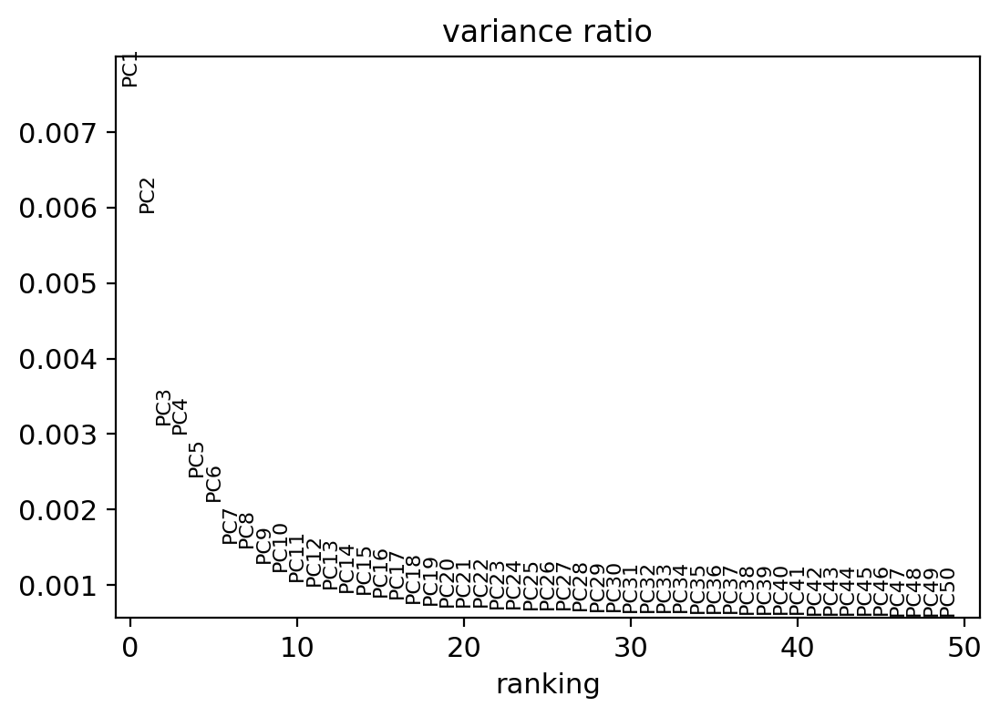

In [89]:
sc.pl.pca_variance_ratio(adata, n_pcs=50)

In [90]:
sc.external.pp.bbknn(adata, batch_key="experiment", use_rep="X_pca", n_pcs=15)

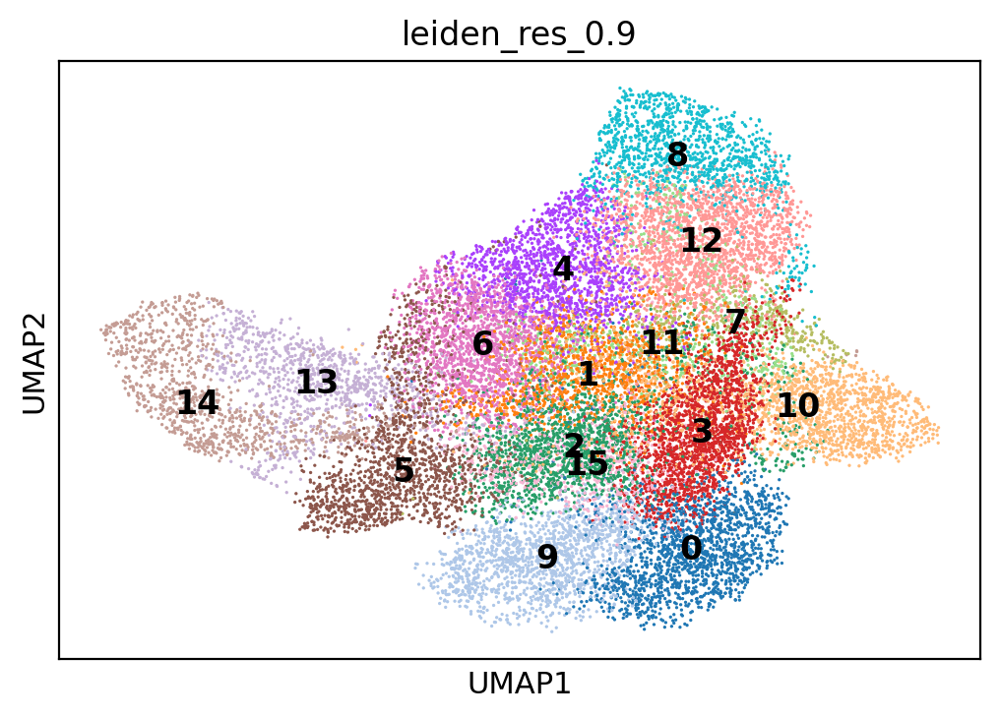

In [91]:
sc.pl.umap(adata, color=["leiden_res_0.9"], legend_loc="on data")

In [92]:
sc.tl.umap(adata)

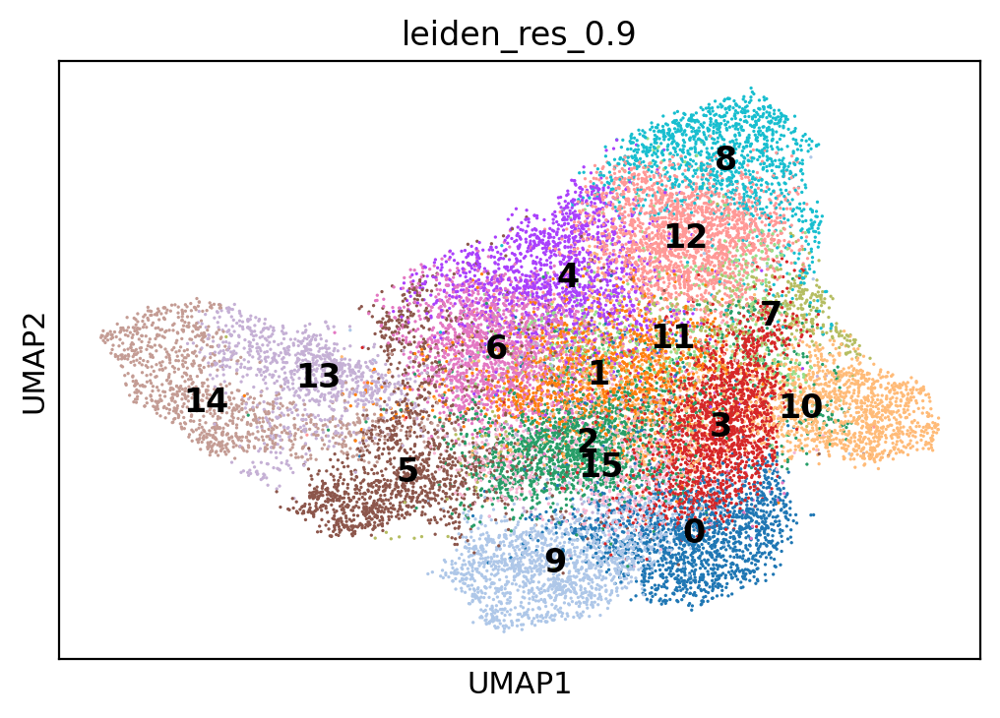

In [93]:
sc.pl.umap(adata, color=["leiden_res_0.9"], legend_loc="on data")

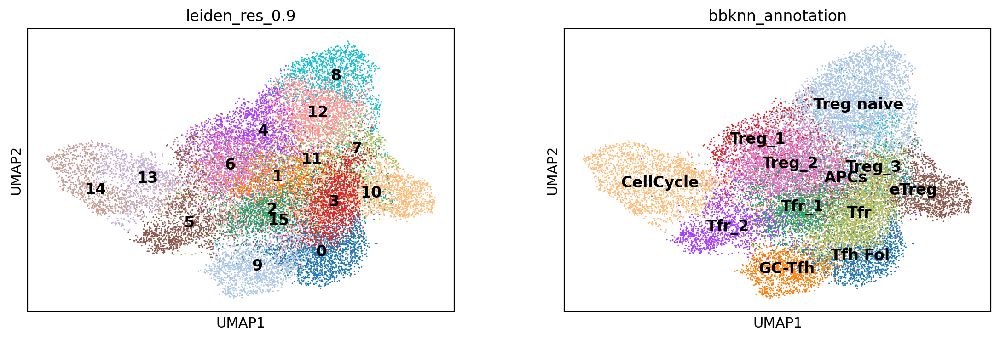

In [94]:
sc.pl.umap(adata, color=["leiden_res_0.9","bbknn_annotation"], 
           legend_loc="on data", ncols=2)

In [95]:
scv.pp.normalize_per_cell(adata, layers = ["spliced", "unspliced"])

Normalized count data: spliced, unspliced.


In [96]:
scv.pp.moments(adata, n_pcs=None, n_neighbors=None, use_rep=None)

computing moments based on connectivities
    finished (0:00:15) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [97]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/128 cores)


  0%|          | 0/84 [00:00<?, ?gene/s]

    finished (0:03:57) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [98]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [99]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/128 cores)


  0%|          | 0/21146 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [100]:
transition_matrix = scv.utils.get_transition_matrix(adata)

In [58]:
transition_matrix

<21146x21146 sparse matrix of type '<class 'numpy.float32'>'
	with 237827 stored elements in Compressed Sparse Row format>

In [101]:
scv.tl.velocity_embedding(adata, basis='umap')

computing velocity embedding
    finished (0:00:06) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


In [102]:
scv.tl.terminal_states(adata)
#Alternatively, we recommend to use cellrank.tl.terminal_states()

computing terminal states
    identified 10 regions of root cells and 1 region of end points .
    finished (0:00:13) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


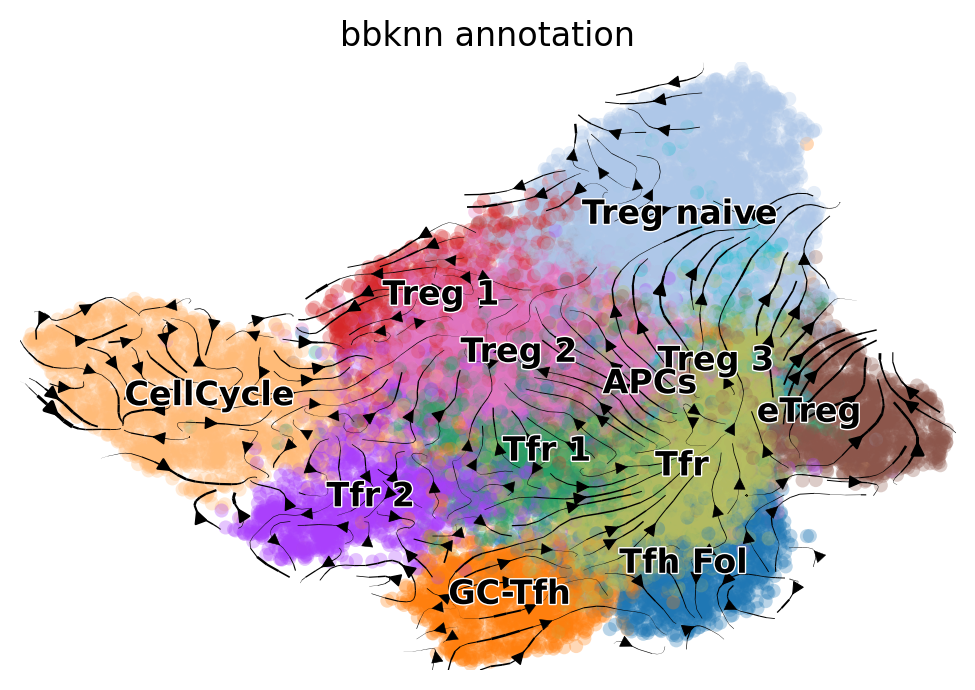

In [103]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='bbknn_annotation')

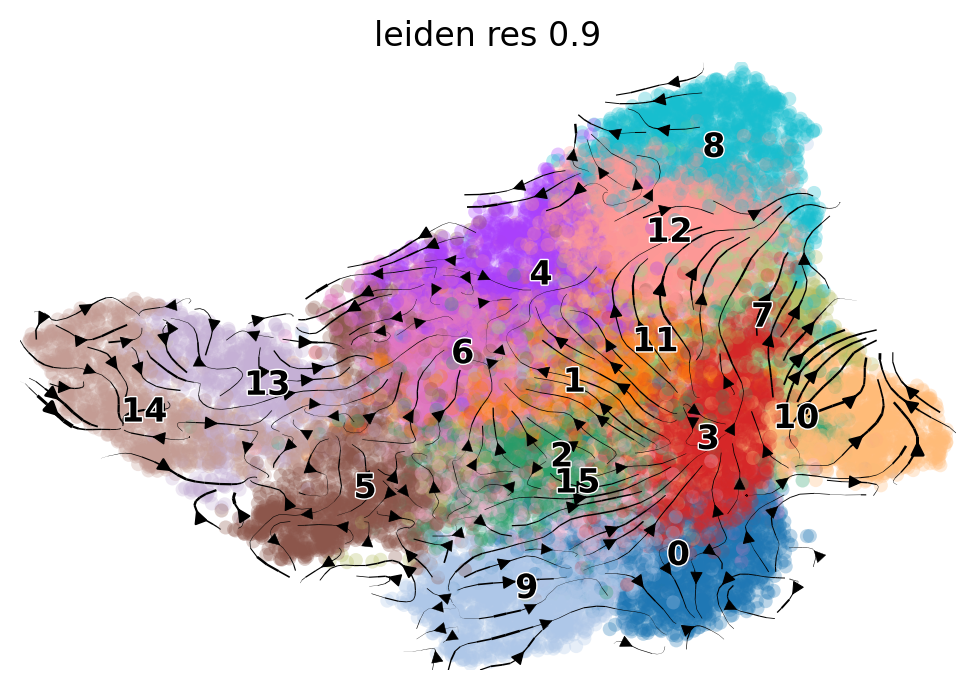

In [104]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='leiden_res_0.9')

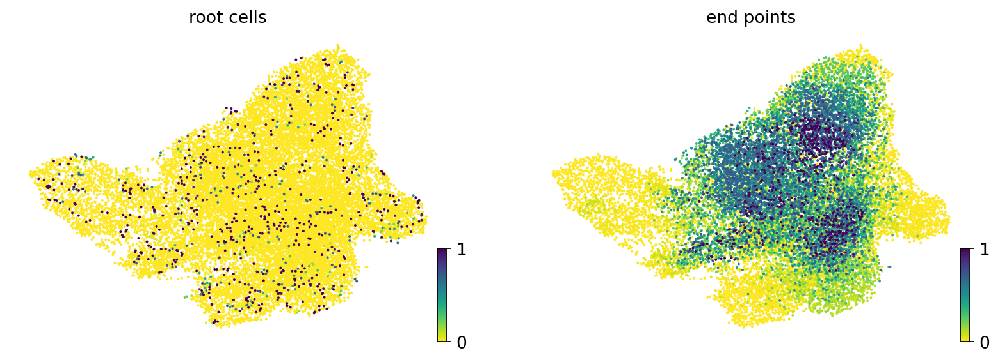

In [105]:
scv.pl.scatter(adata, color=["root_cells", "end_points"])

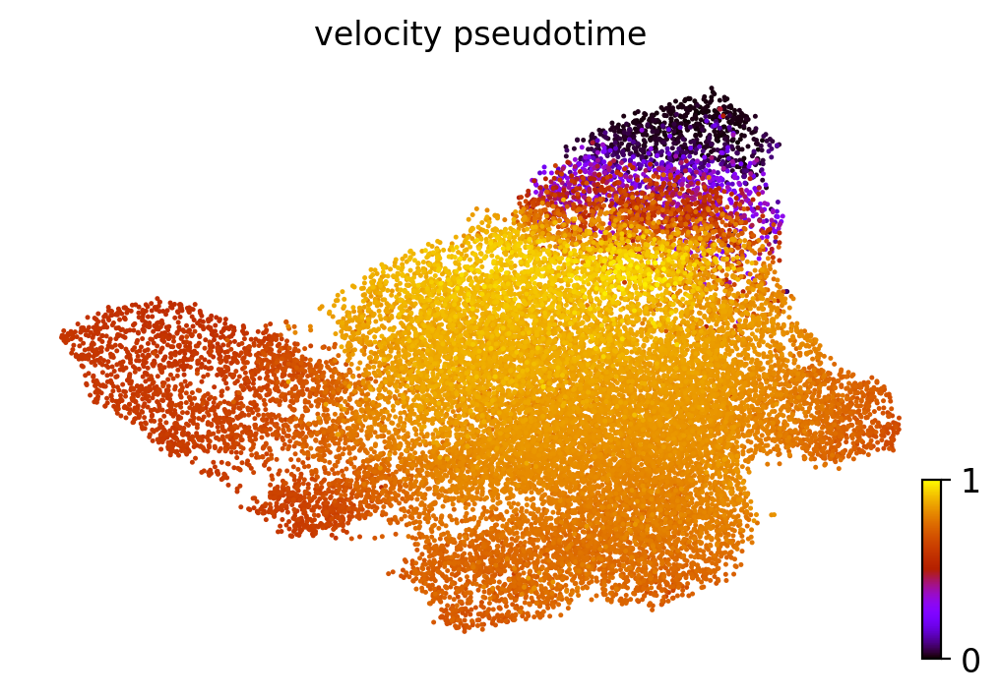

In [106]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [ ]:
adata.write("analysis/rna_velocity/velocity_anndata.h5ad")

In [5]:
adata  = sc.read("analysis/rna_velocity/velocity_anndata.h5ad")

In [11]:
meta_cc = pd.read_csv("analysis/model_classifier/new/meta_cellcycle_predictions.csv", index_col=0)

In [6]:
adata.shape

(21255, 32003)

In [7]:
adata = adata[~adata.obs["leiden_res_0.9"].isin(["0", "9", "16"])].copy()

In [9]:
adata.shape

(18006, 32003)

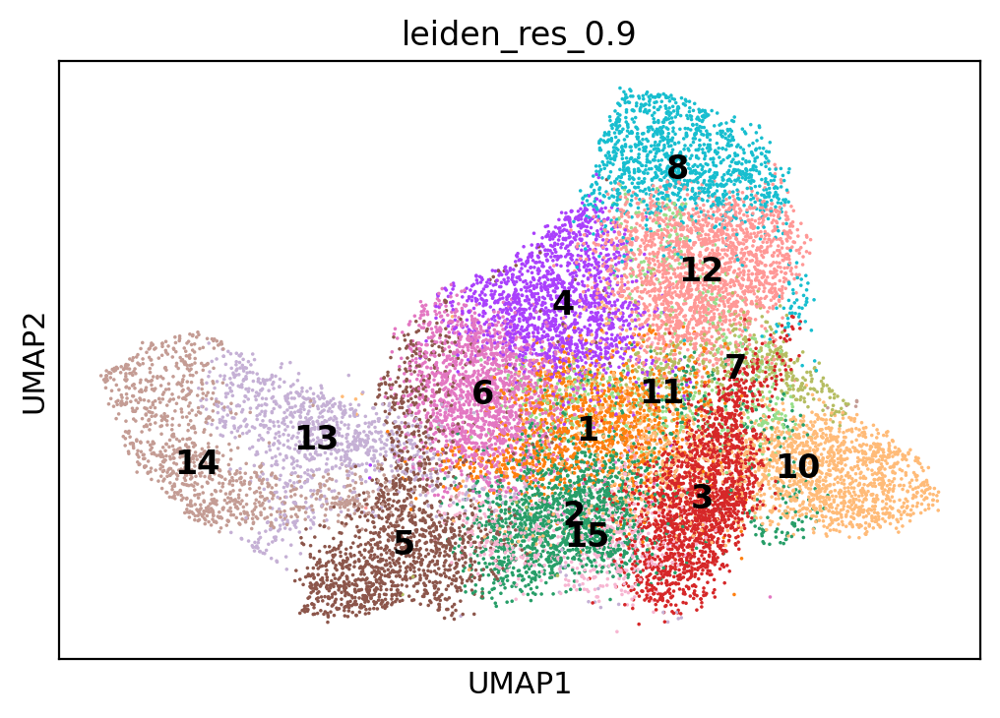

In [8]:
sc.pl.umap(adata, color=["leiden_res_0.9"], 
           legend_loc="on data")

In [12]:
adata = adata[~adata.obs_names.isin(meta_cc.loc[meta_cc["pred_rfc"] == "Tfh"].index.tolist())].copy()

In [13]:
adata.shape

(17420, 32003)

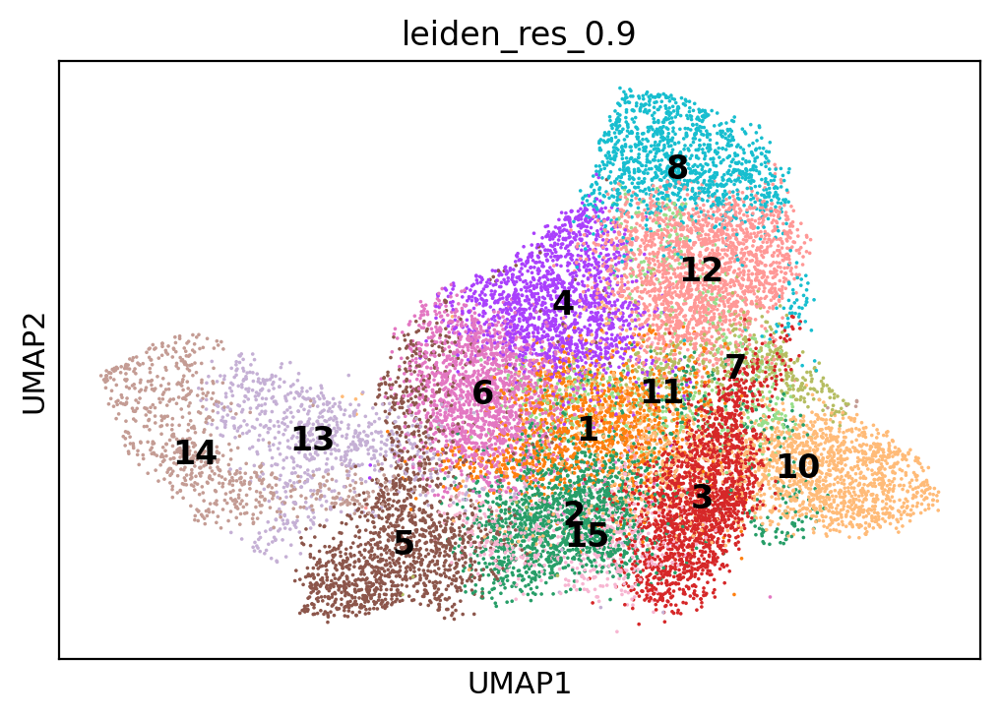

In [14]:
sc.pl.umap(adata, color=["leiden_res_0.9"], 
           legend_loc="on data")

In [17]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000, layer="data")

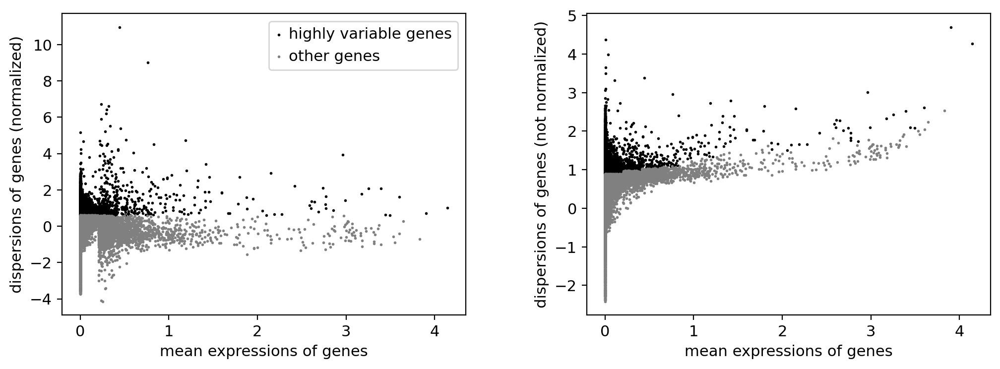

In [19]:
sc.pl.highly_variable_genes(adata)

In [15]:
sc.pp.regress_out(adata, keys=["nCount_RNA","nFeature_RNA","percent.rb","percent.mt"])
sc.pp.scale(adata)

In [16]:
adata.layers["scale_data"] = adata.X.copy()

In [18]:
sc.pp.pca(adata, n_comps=50, mask_var="highly_variable")

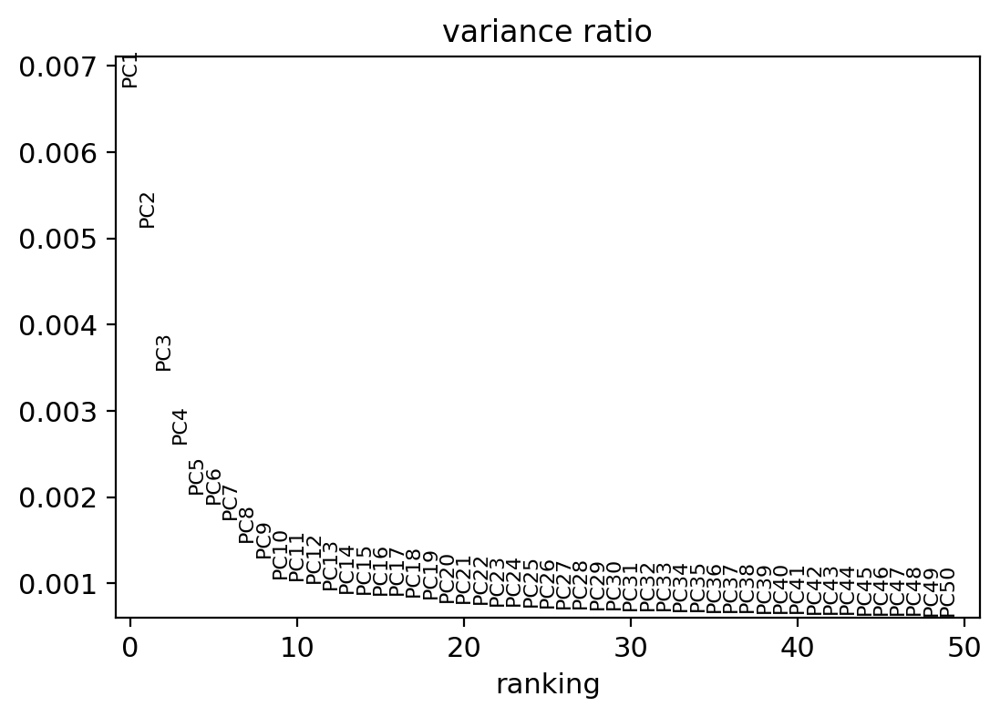

In [20]:
sc.pl.pca_variance_ratio(adata, n_pcs=50)

In [21]:
sc.external.pp.bbknn(adata, batch_key="experiment", use_rep="X_pca", n_pcs=10)

In [22]:
sc.tl.umap(adata)

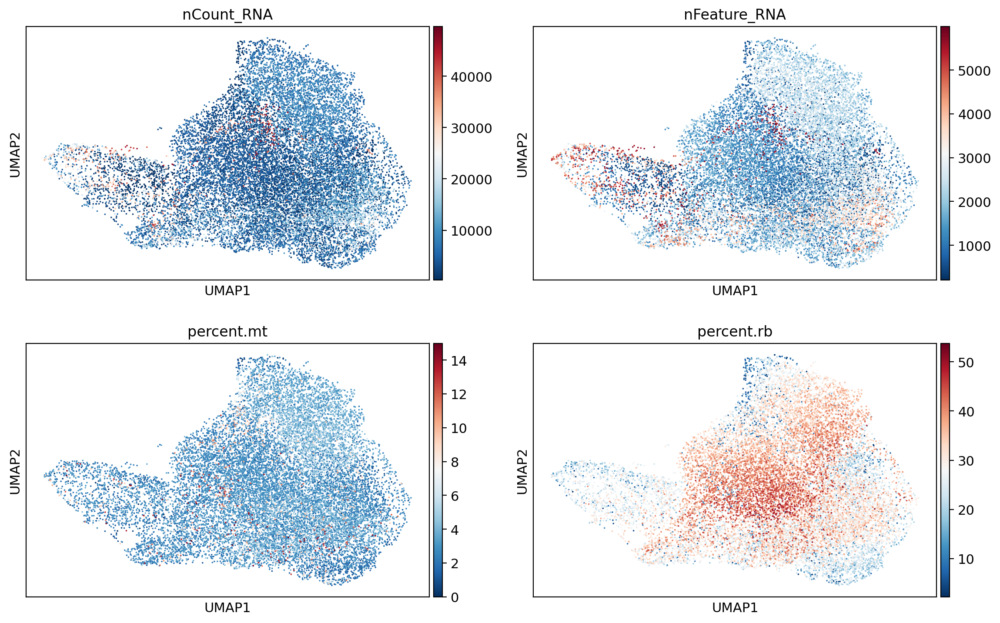

In [23]:
sc.pl.umap(adata, color=["nCount_RNA", "nFeature_RNA","percent.mt","percent.rb"], ncols=2)

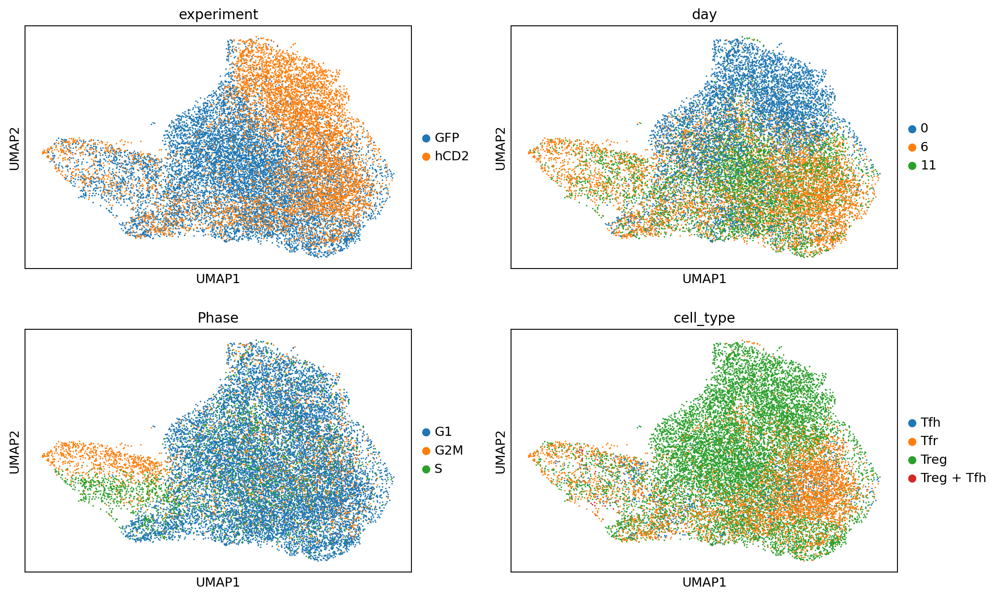

In [24]:
sc.pl.umap(adata, color=["experiment", "day","Phase","cell_type"], ncols=2)

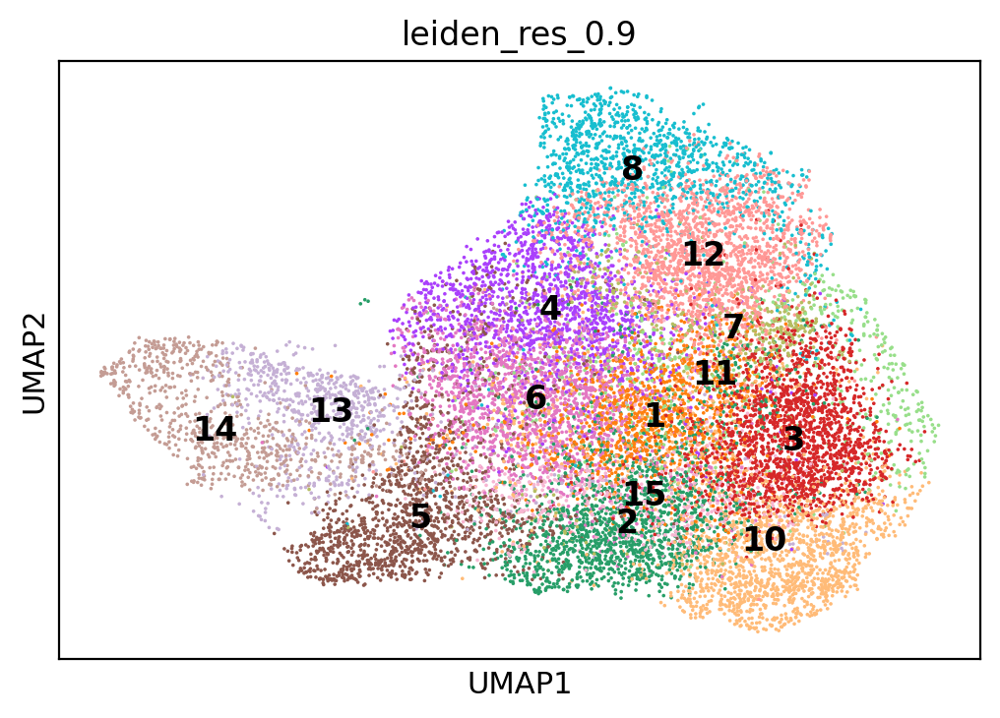

In [25]:
sc.pl.umap(adata, color=["leiden_res_0.9"], 
           legend_loc="on data")

In [27]:
scv.pp.moments(adata, n_pcs=None, n_neighbors=None, use_rep=None)

computing moments based on connectivities
    finished (0:00:12) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [28]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/128 cores)


  0%|          | 0/51 [00:00<?, ?gene/s]

    finished (0:01:40) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [29]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:04) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [30]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/128 cores)


  0%|          | 0/17420 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [31]:
scv.tl.velocity_embedding(adata, basis='umap')

computing velocity embedding
    finished (0:00:05) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


In [32]:
scv.tl.terminal_states(adata)
#Alternatively, we recommend to use cellrank.tl.terminal_states()

computing terminal states
    identified 10 regions of root cells and 2 regions of end points .
    finished (0:00:12) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


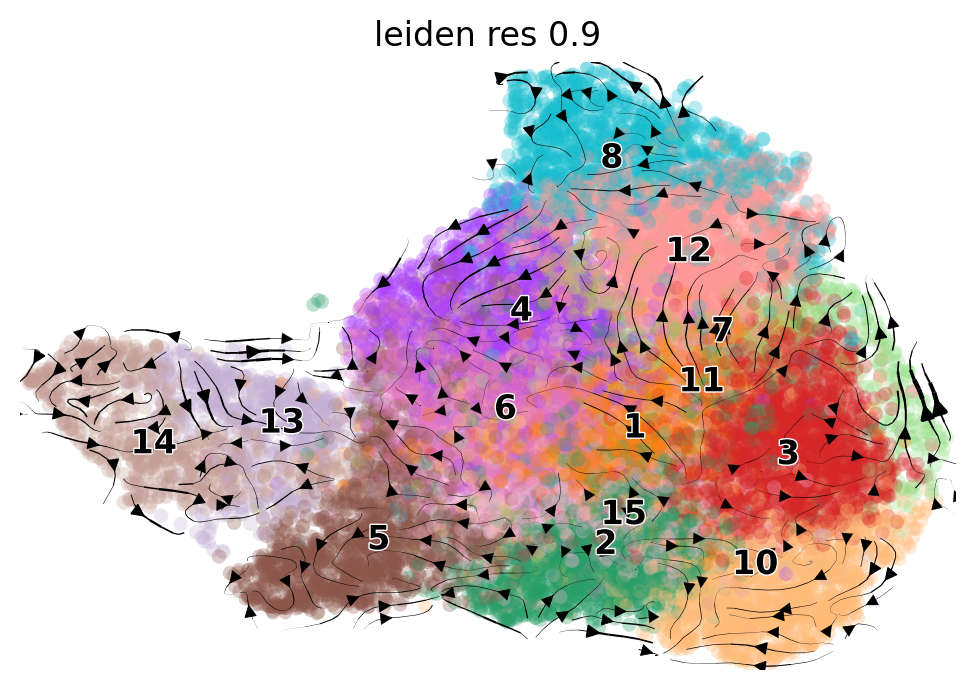

In [33]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='leiden_res_0.9')

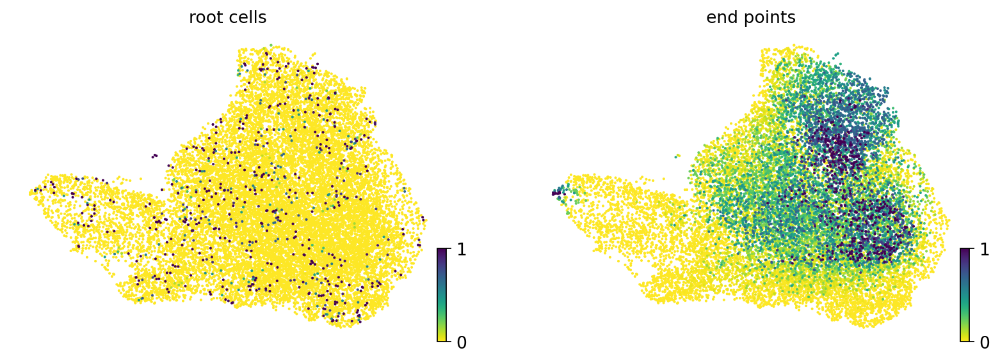

In [35]:
scv.pl.scatter(adata, color=["root_cells", "end_points"])

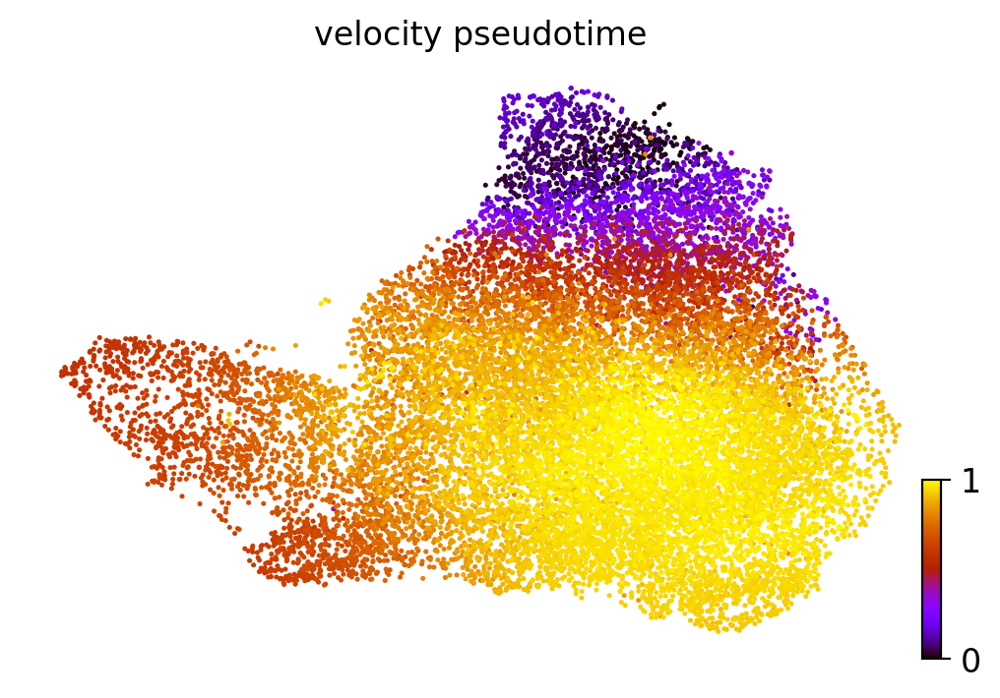

In [36]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [37]:
adata.write("analysis/rna_velocity/velocity_treg_tfr_anndata.h5ad")